In [1]:
import numpy as np 
import geopandas as gpd 
import matplotlib.pyplot as plt 
from matplotlib.colors import ListedColormap
import matplotlib.colors as mcolors
import pandas as pd 
from shapely.geometry import shape 
# from shapely.geometry import Polygon 
import json 
from shapely import wkt 
from shapely.geometry import box
from math import cos, radians
from matplotlib.colors import Normalize
from mpl_toolkits.axes_grid1 import make_axes_locatable
from matplotlib.cm import ScalarMappable
import seaborn as sns 
import contextily as ctx
import xarray as xr
from pathlib import Path
from shapely.geometry import Polygon, Point

# NASA FIRMS US/CANADA

https://firms.modaps.eosdis.nasa.gov/usfs/map/#d:24hrs;@-100.0,40.0,4.0z

FIRMS US/Canada (Fire Information for Resource Management System US/Canada) is a joint effort by NASA and the USDA Forest Service to provide access to low latency satellite imagery and science data products from Earth Observation System (EOS) satellite assets to identify the location, extent and intensity of wildfire activity and its effects.

The five satellite dataset are available daily: MODIS, VIIRS S-NPP, VIIRS NOAA-20, VIIRS NOAA-21, and LANDSAT. The LANDSAT has 30-m resolution while MODIS has 1-km resolution. All VIIRS satellites have 375-m grid size.

We download the data during 2025 LA fire happened in Palisades and Eaton during the early January.

### Load the Landsat data [30m] from Jan 6 to Jan 12

In [2]:
landsat_gdf = gpd.read_file(f"{Path.home()}/WILDFIRE/Cai_Folder/sat_data/DL_FIRE_LS_585434/fire_nrt_LS_585434.shp")

In [3]:
la_bounds = {
    "minx": -118.7, "maxx": -118.0,  # Longitude range
    "miny": 33.7, "maxy": 34.3       # Latitude range
}

# Filter the dataset to keep only the region of LA
landsat_gdf_la = landsat_gdf.cx[la_bounds["minx"]:la_bounds["maxx"], la_bounds["miny"]:la_bounds["maxy"]]

### Clip to the fire perimeter

In [4]:
fire_perimeter = gpd.read_file(f"{Path.home()}/WILDFIRE/Cai_Folder/fires_perimeter.geojson")
fire_perimeter

,mission_group,OBJECTID,GlobalID,type,source,poly_DateCurrent,mission,incident_name,incident_number,area_acres,...,PercentPerimToBeContained,ModifiedBySystem2,sourceoid,websiteId,websiteDbId,dataverseId,displayStatus,Shape__Area,Shape__Length,geometry
0,Eaton,1269,ea6b6983-73b6-49fa-b467-1081579fb284,Heat Perimeter,FIRIS,2025-01-09 02:29:10.844,CA-LAC-EATON-N57B,Eaton,72660adc-b5ef-4d96-a33f-b4ea3740a4e3,10589.956010,...,None,None,None,dbfa574e-1b10-4467-b5e5-7d1c06ebc8dc,4319,2b91dbc1-79cd-ef11-b8e9-001dd804aa64,Inactive,0.004192,0.818015,"MULTIPOLYGON (((-118.15647 34.18125, -118.1564..."
1,Palisades,1264,0bc1ddb3-63bf-4fd8-a01b-d522f57e4083,Heat Perimeter,FIRIS,2025-01-07 23:17:39.000,CA-LFD-PALISADES-N57B,Palisades,,1261.520779,...,None,None,None,abfed7a3-794a-4294-9852-43176dcbc18a,4318,f0a2f70e-2dcd-ef11-b8e9-001dd804aa64,Active,0.000499,0.342099,"MULTIPOLYGON (((-118.56728 34.04256, -118.5672..."


In [5]:
landsat_gdf_la = landsat_gdf_la.to_crs(fire_perimeter.crs)

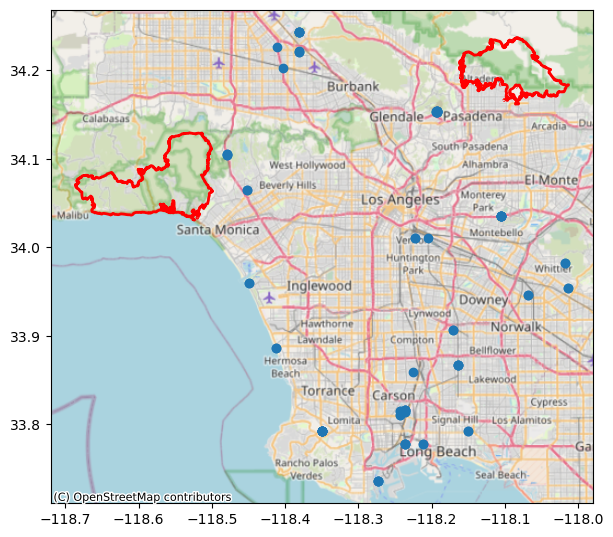

In [6]:
f,ax=plt.subplots(figsize=(7,10))

landsat_gdf_la.plot(ax=ax)
gpd.GeoSeries(fire_perimeter.geometry).plot(
    ax=ax, edgecolor="red", facecolor="none", linewidth=2
)

ctx.add_basemap(ax, source=ctx.providers.OpenStreetMap.Mapnik, crs=fire_perimeter.crs)

#### Ops, no data from landsat
### Load the MODIS data [1KM] from Jan 6 to Jan 12

In [7]:
modis_gdf = gpd.read_file(f"{Path.home()}/WILDFIRE/Cai_Folder/sat_data/DL_FIRE_M-C61_585433/fire_nrt_M-C61_585433.shp")

In [8]:
# Filter the dataset to keep only the region of LA
modis_gdf_la = modis_gdf.cx[la_bounds["minx"]:la_bounds["maxx"], la_bounds["miny"]:la_bounds["maxy"]]

In [9]:
modis_gdf_la = modis_gdf_la.to_crs(fire_perimeter.crs)

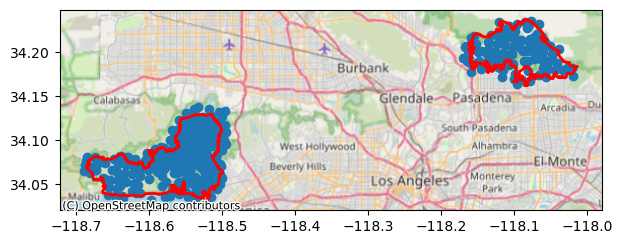

In [10]:
f,ax=plt.subplots(figsize=(7,10))

modis_gdf_la.plot(ax=ax)
gpd.GeoSeries(fire_perimeter.geometry).plot(
    ax=ax, edgecolor="red", facecolor="none", linewidth=2
)

ctx.add_basemap(ax, source=ctx.providers.OpenStreetMap.Mapnik, crs=fire_perimeter.crs)

In [11]:
modis_eaton = modis_gdf_la.clip(fire_perimeter.geometry.iloc[0])
modis_palisades = modis_gdf_la.clip(fire_perimeter.geometry.iloc[1])

### Load the S-NPP VIIRS data [375 M] from Jan 6 to Jan 12

In [12]:
sv_gdf = gpd.read_file(f"{Path.home()}/WILDFIRE/Cai_Folder/sat_data/DL_FIRE_SV-C2_585437/fire_nrt_SV-C2_585437.shp")

In [13]:
# Filter the dataset to keep only the region of LA
sv_gdf_la = sv_gdf.cx[la_bounds["minx"]:la_bounds["maxx"], la_bounds["miny"]:la_bounds["maxy"]]

In [14]:
sv_gdf_la = sv_gdf_la.to_crs(fire_perimeter.crs)

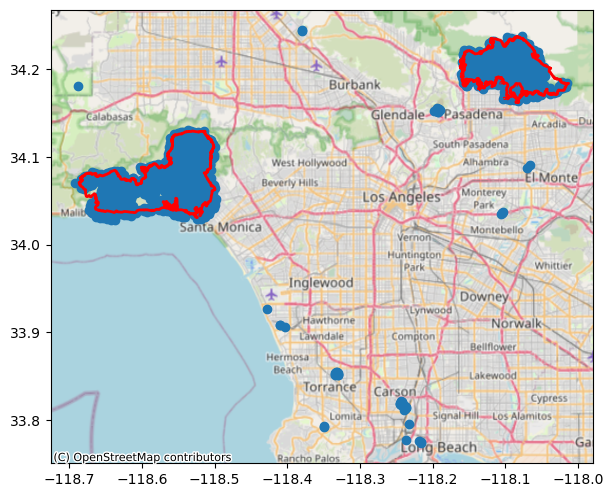

In [15]:
f,ax=plt.subplots(figsize=(7,10))

sv_gdf_la.plot(ax=ax)
gpd.GeoSeries(fire_perimeter.geometry).plot(
    ax=ax, edgecolor="red", facecolor="none", linewidth=2
)

ctx.add_basemap(ax, source=ctx.providers.OpenStreetMap.Mapnik, crs=landsat_gdf_la.crs)

In [16]:
sv_eaton = sv_gdf_la.clip(fire_perimeter.geometry.iloc[0])
sv_palisades = sv_gdf_la.clip(fire_perimeter.geometry.iloc[1])

### Load the JPSS NOAA-20 VIIRS data [375 M] from Jan 6 to Jan 12

In [17]:
j1_gdf = gpd.read_file(f"{Path.home()}/WILDFIRE/Cai_Folder/sat_data/DL_FIRE_J1V-C2_585435/fire_nrt_J1V-C2_585435.shp")

In [18]:
# Filter the dataset to keep only the region of LA
j1_gdf_la = j1_gdf.cx[la_bounds["minx"]:la_bounds["maxx"], la_bounds["miny"]:la_bounds["maxy"]]

In [19]:
j1_gdf_la = j1_gdf_la.to_crs(fire_perimeter.crs)

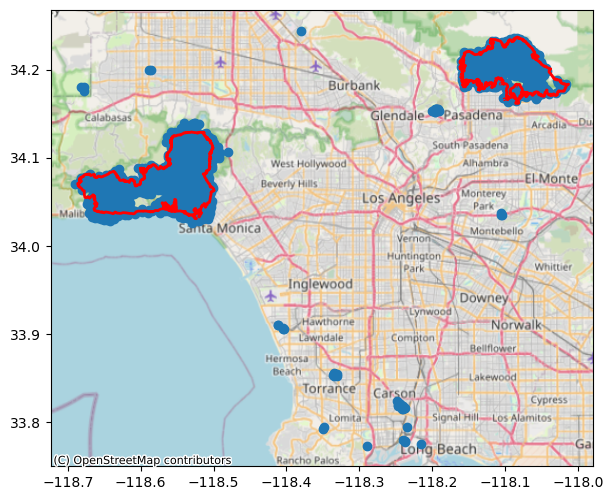

In [20]:
f,ax=plt.subplots(figsize=(7,10))

j1_gdf_la.plot(ax=ax)
gpd.GeoSeries(fire_perimeter.geometry).plot(
    ax=ax, edgecolor="red", facecolor="none", linewidth=2
)

ctx.add_basemap(ax, source=ctx.providers.OpenStreetMap.Mapnik, crs=fire_perimeter.crs)

In [21]:
j1_eaton = j1_gdf_la.clip(fire_perimeter.geometry.iloc[0])
j1_palisades = j1_gdf_la.clip(fire_perimeter.geometry.iloc[1])

### Load the JPSS NOAA-21 VIIRS data [375 M] from Jan 6 to Jan 12

In [22]:
j2_gdf = gpd.read_file(f"{Path.home()}/WILDFIRE/Cai_Folder/sat_data/DL_FIRE_J2V-C2_585436/fire_nrt_J2V-C2_585436.shp")

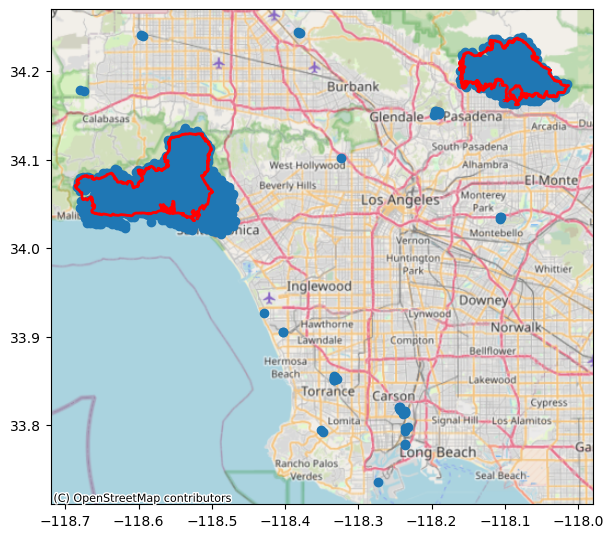

In [23]:
# Filter the dataset to keep only the region of LA
j2_gdf_la = j2_gdf.cx[la_bounds["minx"]:la_bounds["maxx"], la_bounds["miny"]:la_bounds["maxy"]]

j2_gdf_la = j2_gdf_la.to_crs(fire_perimeter.crs)

f,ax=plt.subplots(figsize=(7,10))

j2_gdf_la.plot(ax=ax)
gpd.GeoSeries(fire_perimeter.geometry).plot(
    ax=ax, edgecolor="red", facecolor="none", linewidth=2
)

ctx.add_basemap(ax, source=ctx.providers.OpenStreetMap.Mapnik, crs=fire_perimeter.crs)

In [24]:
j2_eaton = j2_gdf_la.clip(fire_perimeter.geometry.iloc[0])
j2_palisades = j2_gdf_la.clip(fire_perimeter.geometry.iloc[1])

## Merge all available data to one dataset for each region

In [25]:
for gdf in [j1_eaton, j1_palisades, j2_eaton, j2_palisades, modis_eaton, modis_palisades, sv_eaton, sv_palisades]:
    gdf.loc[:, "ACQ_DATE"] = pd.to_datetime(gdf["ACQ_DATE"])

In [26]:
merged_eaton_gdf = gpd.GeoDataFrame(pd.concat([j1_eaton, j2_eaton, modis_eaton, sv_eaton], ignore_index=True))
merged_palisades_gdf = gpd.GeoDataFrame(pd.concat([j1_palisades, j2_palisades, modis_palisades, sv_palisades], ignore_index=True))

# Sort by time
merged_eaton_gdf = merged_eaton_gdf.sort_values(by="ACQ_DATE").reset_index(drop=True)
merged_palisades_gdf = merged_palisades_gdf.sort_values(by="ACQ_DATE").reset_index(drop=True)

#### Visualize the daily change

We use FRP, which depicts the pixel-integrated fire radiative power in megawatts (MW).

One issue is that the different resolution of two satellite; MODIS is 1-km pixel data while VIIRS is 375-m pixel data. The FRP is the pixel-integrated value. Therefore, we need to adjust the FRP values from these two dataset to a same baseline.

#### Eaton

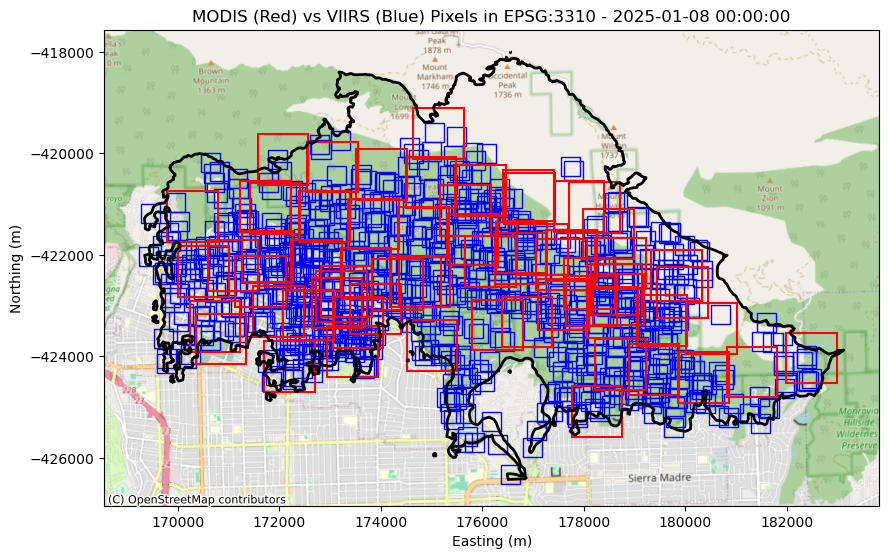

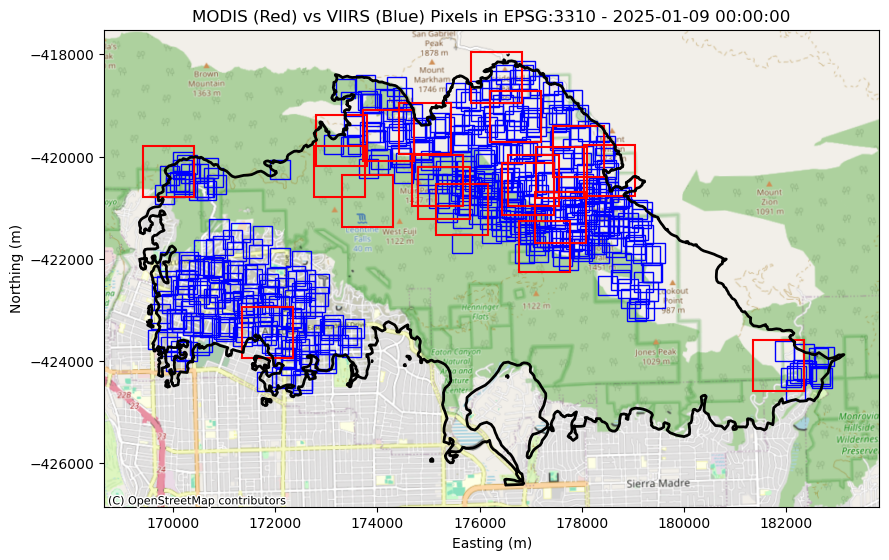

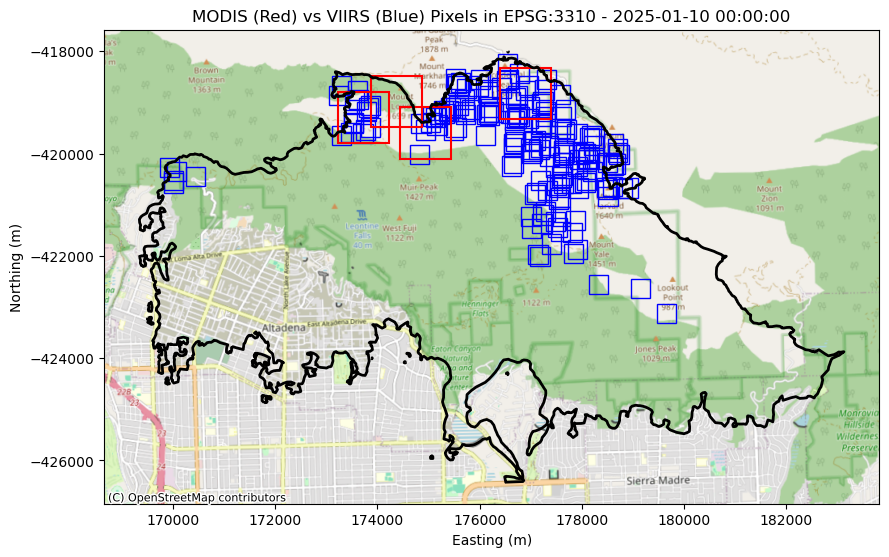

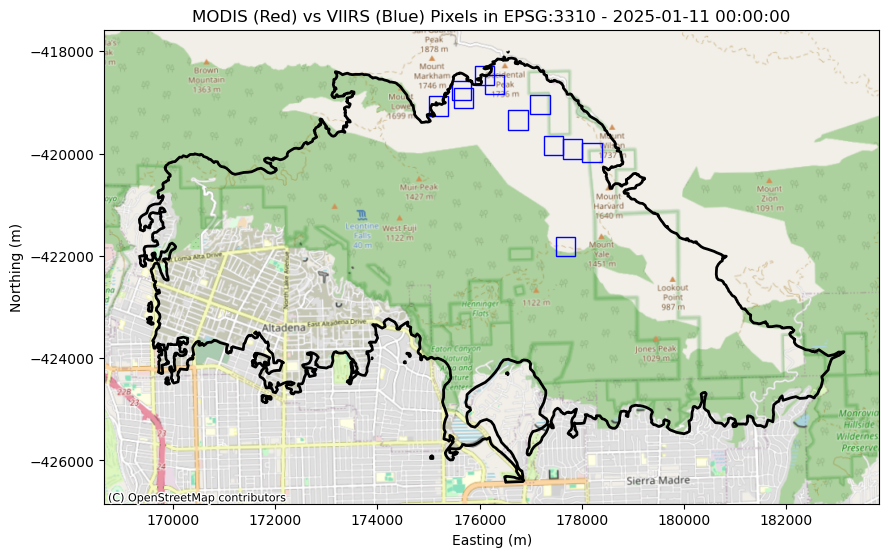

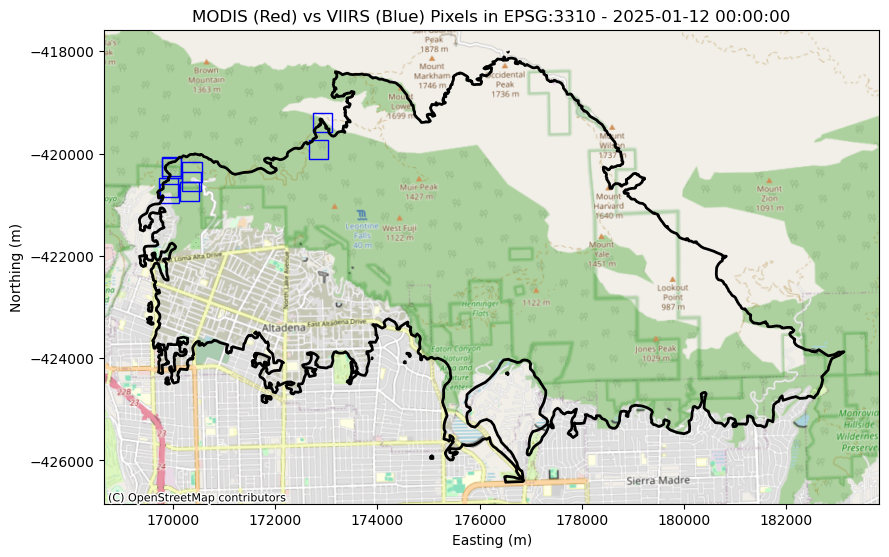

In [27]:
from pyproj import Transformer
import matplotlib.patches as patches

# Define the transformer to convert from WGS84 (EPSG:4326) to California Albers (EPSG:3310)
transformer = Transformer.from_crs("EPSG:4326", "EPSG:3310", always_xy=True)

# Reproject the fire perimeter
fire_perimeter = fire_perimeter.to_crs(epsg=3310)

# Function to plot squares in EPSG:3310
def plot_pixel(ax, lon, lat, pixel_size, color, linewidth):
    x, y = transformer.transform(lon, lat)  # Convert to EPSG:3310
    rect = patches.Rectangle(
        (x - pixel_size / 2, y - pixel_size / 2),  
        pixel_size, pixel_size,  
        linewidth=linewidth, edgecolor=color, facecolor='none'
    )
    ax.add_patch(rect)

# Select the date for filtering
unique_dates = merged_eaton_gdf['ACQ_DATE'].unique()

for date in unique_dates:
    day_data = merged_eaton_gdf[merged_eaton_gdf['ACQ_DATE'] == date]
    
    # Create figure
    fig, ax = plt.subplots(figsize=(10, 10))
    
    # Filter and plot VIIRS data (Blue, 375m)
    viirs_data = day_data[day_data['INSTRUMENT'] == 'VIIRS']
    for _, row in viirs_data.iterrows():
        plot_pixel(ax, row['LONGITUDE'], row['LATITUDE'], 375, 'blue', 1)
    
    # Filter and plot MODIS data (Red, 1 km)
    modis_data = day_data[day_data['INSTRUMENT'] == 'MODIS']
    for _, row in modis_data.iterrows():
        plot_pixel(ax, row['LONGITUDE'], row['LATITUDE'], 1000, 'red', 1.5)
    
    # Plot fire perimeter
    gpd.GeoSeries(fire_perimeter.geometry.iloc[0]).plot(ax=ax, edgecolor="k", facecolor="none", linewidth=2)
    
    ctx.add_basemap(ax, source=ctx.providers.OpenStreetMap.Mapnik, crs=fire_perimeter.crs)
    
    ax.set_xlabel('Easting (m)')
    ax.set_ylabel('Northing (m)')
    ax.set_title(f'MODIS (Red) vs VIIRS (Blue) Pixels in EPSG:3310 - {date}')
    plt.show()


#### Palisades

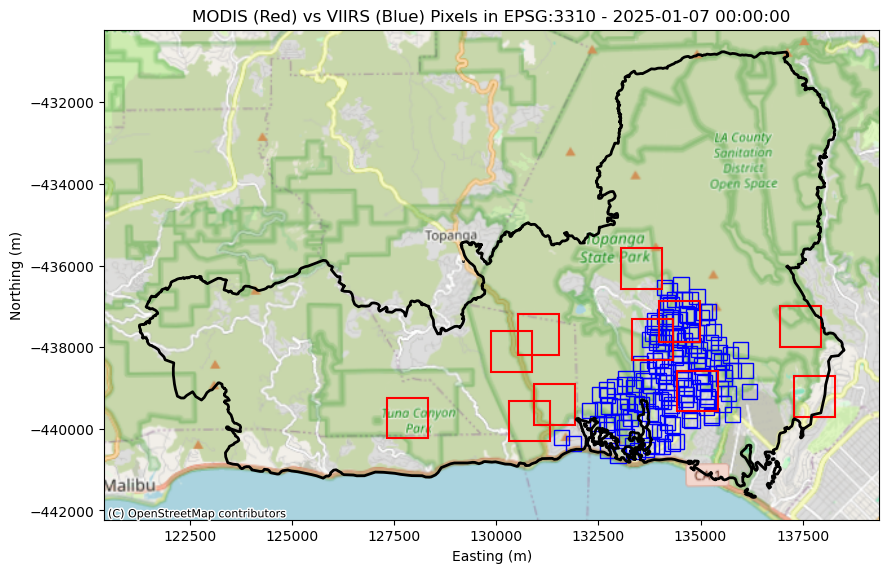

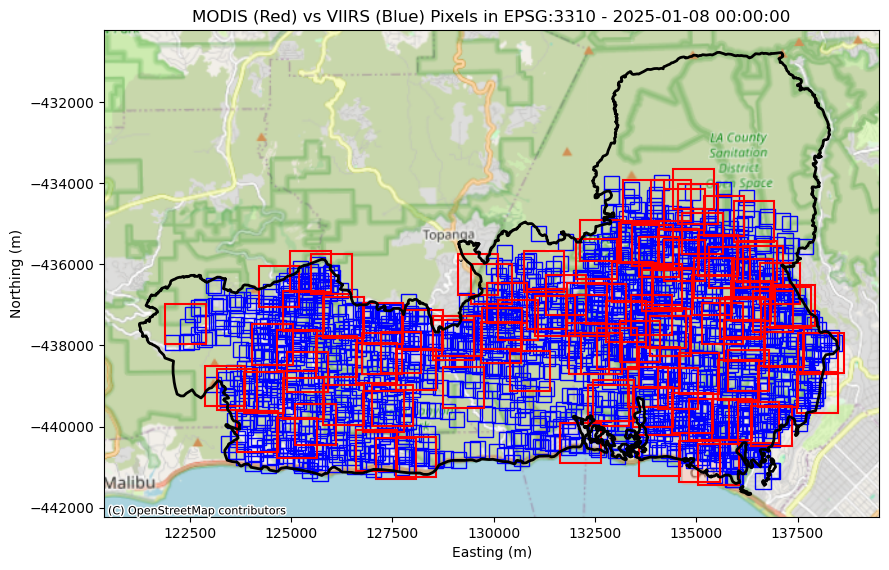

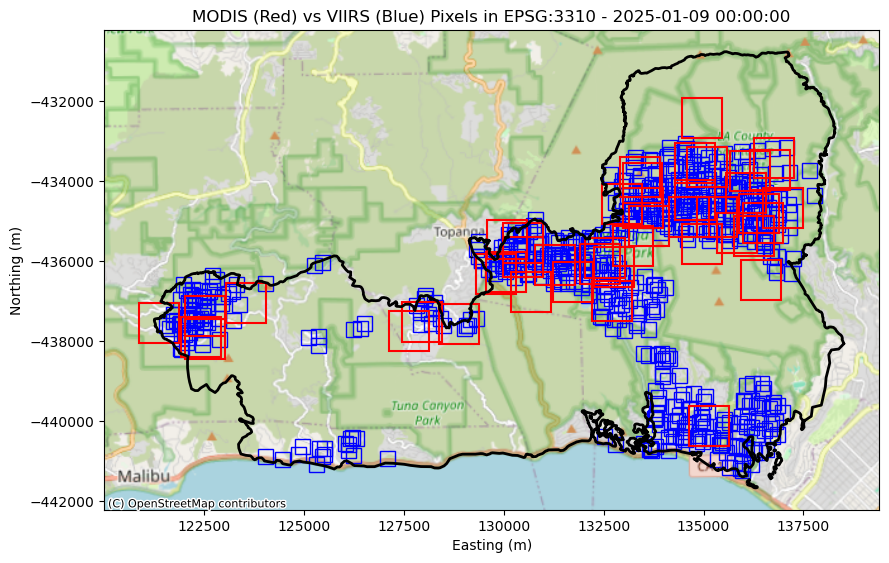

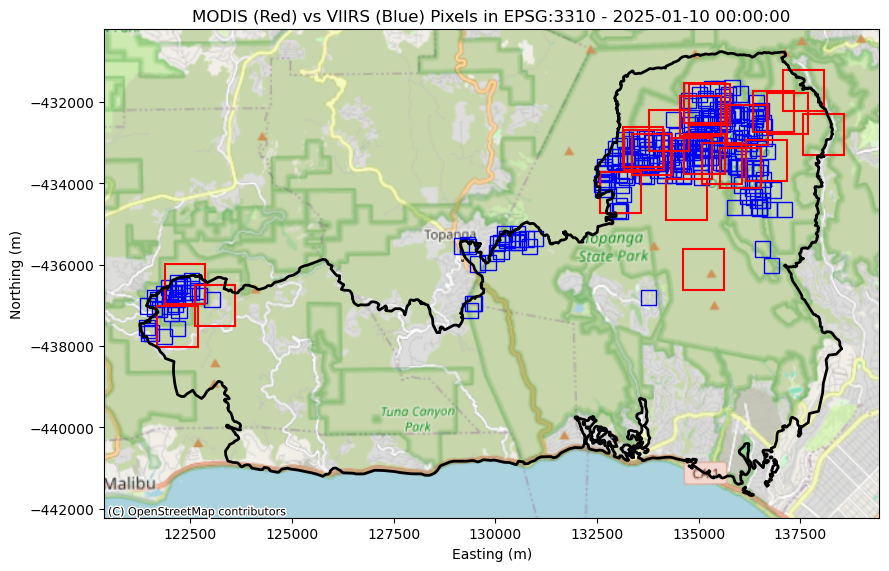

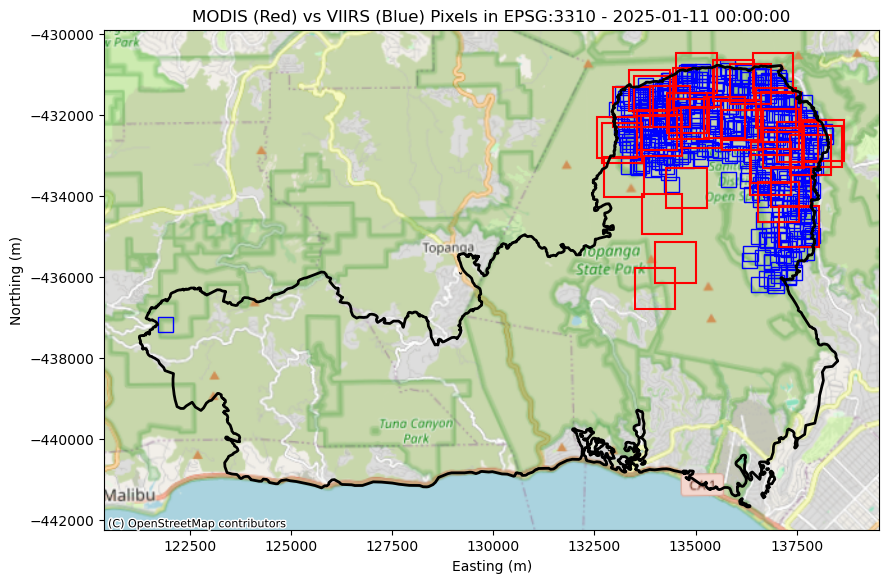

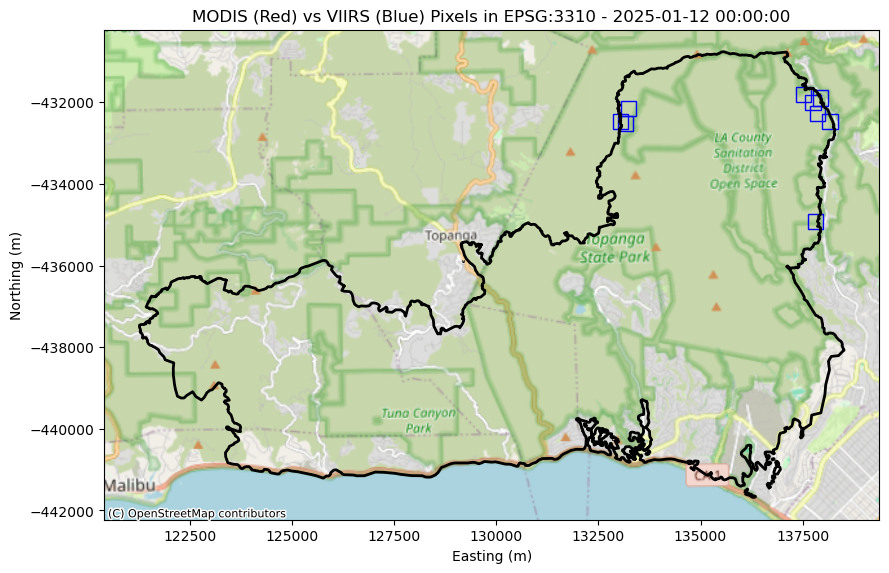

In [28]:
# Define the transformer to convert from WGS84 (EPSG:4326) to California Albers (EPSG:3310)
transformer = Transformer.from_crs("EPSG:4326", "EPSG:3310", always_xy=True)

# Reproject the fire perimeter
fire_perimeter = fire_perimeter.to_crs(epsg=3310)

# Function to plot squares in EPSG:3310
def plot_pixel(ax, lon, lat, pixel_size, color, linewidth):
    x, y = transformer.transform(lon, lat)  # Convert to EPSG:3310
    rect = patches.Rectangle(
        (x - pixel_size / 2, y - pixel_size / 2),  
        pixel_size, pixel_size,  
        linewidth=linewidth, edgecolor=color, facecolor='none'
    )
    ax.add_patch(rect)

# Select the date for filtering
unique_dates = merged_palisades_gdf['ACQ_DATE'].unique()

for date in unique_dates:
    day_data = merged_palisades_gdf[merged_palisades_gdf['ACQ_DATE'] == date]
    
    # Create figure
    fig, ax = plt.subplots(figsize=(10, 10))
    
    # Filter and plot VIIRS data (Blue, 375m)
    viirs_data = day_data[day_data['INSTRUMENT'] == 'VIIRS']
    for _, row in viirs_data.iterrows():
        plot_pixel(ax, row['LONGITUDE'], row['LATITUDE'], 375, 'blue', 1)
    
    # Filter and plot MODIS data (Red, 1 km)
    modis_data = day_data[day_data['INSTRUMENT'] == 'MODIS']
    for _, row in modis_data.iterrows():
        plot_pixel(ax, row['LONGITUDE'], row['LATITUDE'], 1000, 'red', 1.5)
    
    # Plot fire perimeter
    gpd.GeoSeries(fire_perimeter.geometry.iloc[1]).plot(ax=ax, edgecolor="k", facecolor="none", linewidth=2)
    
    ctx.add_basemap(ax, source=ctx.providers.OpenStreetMap.Mapnik, crs=fire_perimeter.crs)
    
    ax.set_xlabel('Easting (m)')
    ax.set_ylabel('Northing (m)')
    ax.set_title(f'MODIS (Red) vs VIIRS (Blue) Pixels in EPSG:3310 - {date}')
    plt.show()


## FRP normalization to make spatial comparison over the fire duration

In [29]:
# Define pixel areas (in km²)
MODIS_AREA = 1.0  # 1 km² per pixel
VIIRS_AREA = 0.14  # 375m x 375m = ~0.14 km² per pixel

# Normalize FRP function
def normalize_frp(gdf):
    gdf = gdf.copy()
    gdf["FRPD"] = gdf.apply(lambda row: row["FRP"] / MODIS_AREA if row["INSTRUMENT"] == "MODIS" else row["FRP"] / VIIRS_AREA, axis=1)
    return gdf

In [30]:
merged_palisades_gdf = normalize_frp(merged_palisades_gdf)
merged_eaton_gdf = normalize_frp(merged_eaton_gdf)

## Plot the FRP density in hexbin plot

In [33]:
# Function to plot FRP using hexbin
def plot_hexbin_fires(gdf, date, ID, fire_perimeter, gridsize=50, cmap="YlOrRd", mode="density"):

    # Filter data for selected date
    daily_gdf = gdf[gdf["ACQ_DATE"] == date]

    if daily_gdf.empty:
        print(f"No data for {date}")
        return

    if daily_gdf.crs != "EPSG:32611":
        daily_gdf = daily_gdf.to_crs(epsg=32611)

    x = daily_gdf.geometry.x
    y = daily_gdf.geometry.y

    if mode == "density":
        frp_data = daily_gdf["FRPD"]
        colorbar_label = "Mean Fire Radiative Power Density (MW/km²)"
        vmax = 40  # Adjustable upper limit for visualization

        # Create hexbin plot
        fig, ax = plt.subplots(figsize=(10, 5))
        hb = ax.hexbin(x, y, C=frp_data, gridsize=int(gridsize), cmap=cmap, reduce_C_function=np.mean, 
                       vmin=10, vmax=vmax, edgecolors="black")

    else:
        raise ValueError("Invalid mode. Choose 'density' or 'total'.")


    cb = plt.colorbar(hb, ax=ax)
    cb.set_label(colorbar_label)

    fire_perimeter = fire_perimeter.to_crs(epsg=32611)

    gpd.GeoSeries(fire_perimeter.geometry.iloc[ID]).plot(ax=ax, edgecolor="red", facecolor="none", linewidth=2)

    ctx.add_basemap(ax, source=ctx.providers.OpenStreetMap.Mapnik, crs=daily_gdf.crs)

    date_str = date.strftime('%Y-%m-%d')
    ax.set_title(f"Fire Intensity on {date_str} ({mode.capitalize()})")
    ax.set_axis_off()

    fire_name = "pali" if ID == 1 else "eaton"

    # Save plot with date and fire name in filename
    save_path = f"plots/fire_intensity_{fire_name}_{date_str}.png"
    plt.savefig(save_path, format="png", dpi=300, bbox_inches="tight")

    plt.show()

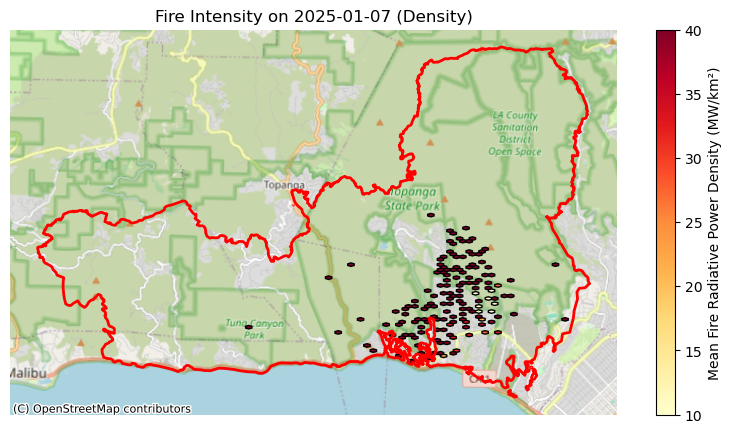

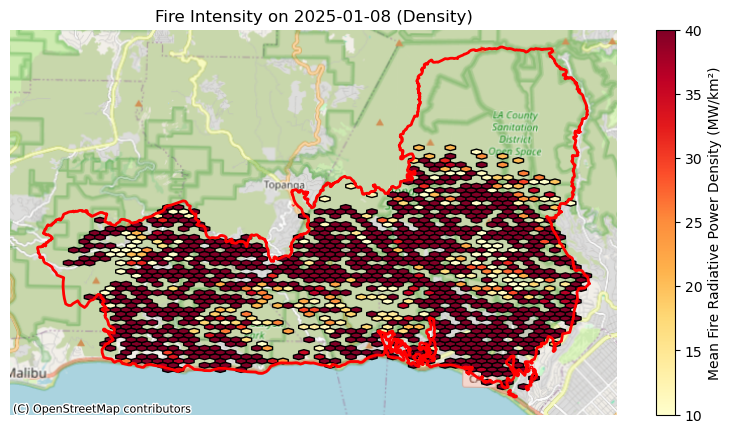

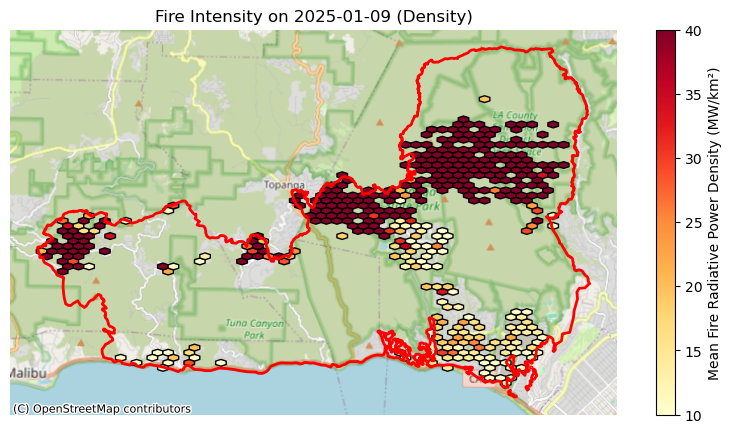

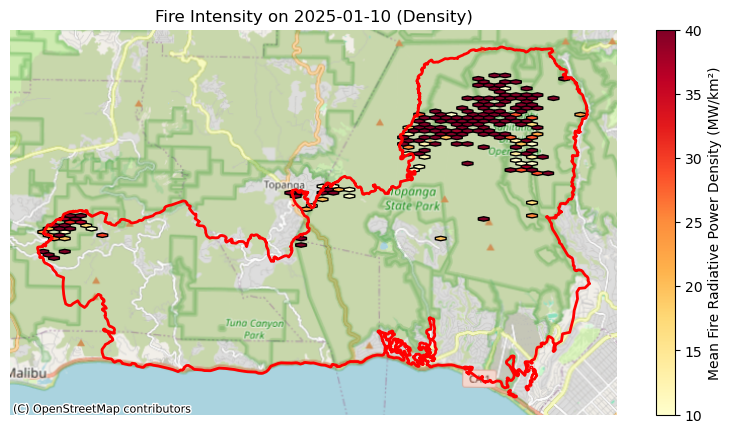

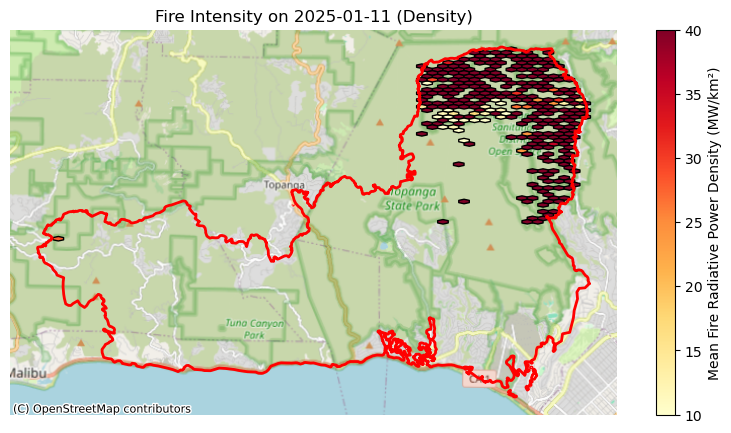

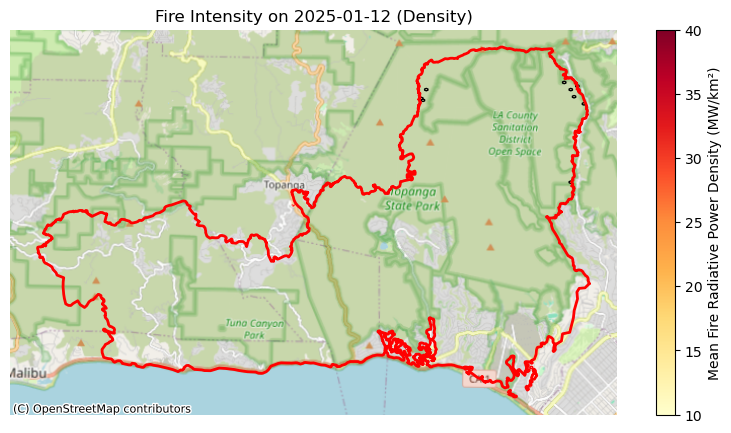

In [34]:
# Loop through each unique date and plot the hexbin
unique_dates = merged_palisades_gdf['ACQ_DATE'].unique()

# Assuming fire_perimeter is already defined somewhere globally
for date in unique_dates:
    plot_hexbin_fires(merged_palisades_gdf, date=date, ID=1, fire_perimeter=fire_perimeter, mode="density")

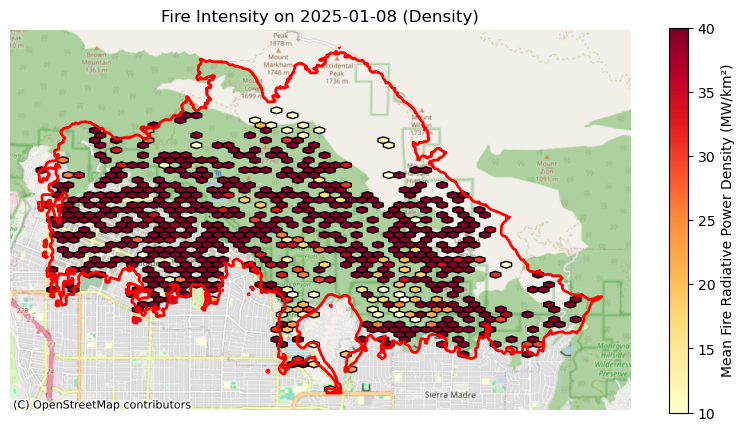

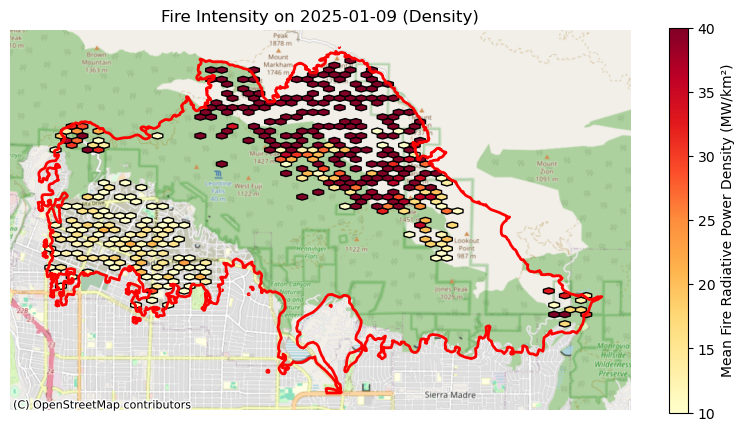

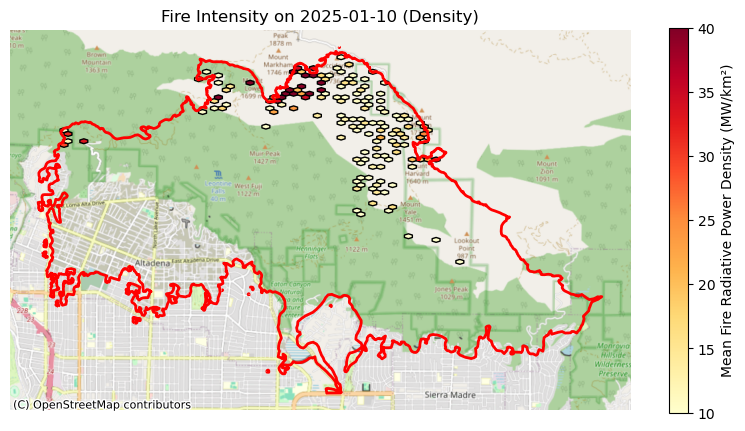

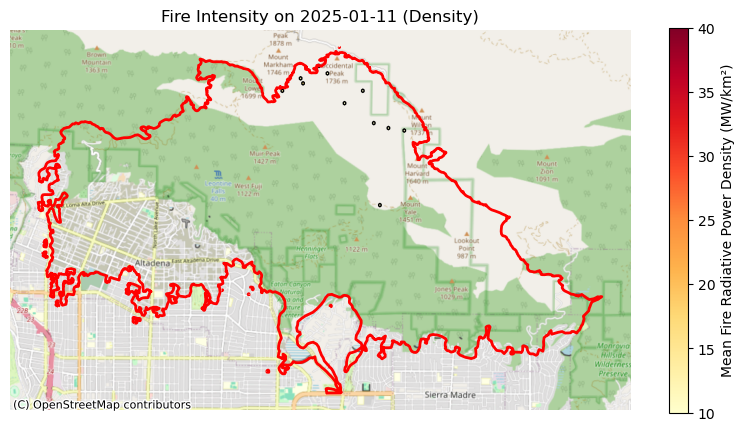

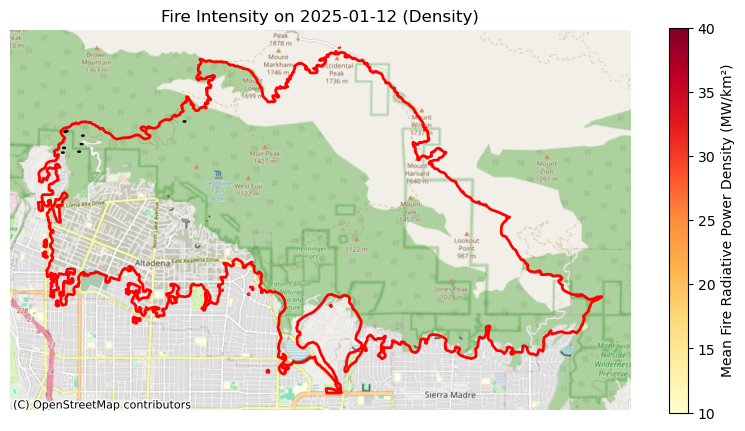

In [35]:
# Loop through each unique date and plot the hexbin
unique_dates = merged_eaton_gdf['ACQ_DATE'].unique()

# Assuming fire_perimeter is already defined somewhere globally
for date in unique_dates:
    plot_hexbin_fires(merged_eaton_gdf, date=date, ID=0, fire_perimeter=fire_perimeter, mode="density")

### Plot the time series of total FRP (MW)

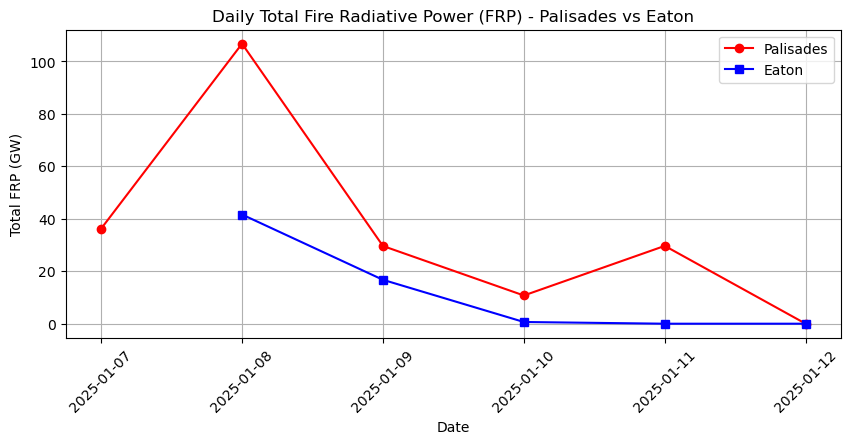

In [34]:

# Compute total FRP per day for each region
total_frp_palisades = merged_palisades_gdf.groupby(["ACQ_DATE"])["FRP"].sum().reset_index()
total_frp_eaton = merged_eaton_gdf.groupby(["ACQ_DATE"])["FRP"].sum().reset_index()

# Plot the time series for both regions
plt.figure(figsize=(10, 4))


plt.plot(total_frp_palisades["ACQ_DATE"], total_frp_palisades["FRP"]/1e3, marker="o", linestyle="-", color="red", label="Palisades")
plt.plot(total_frp_eaton["ACQ_DATE"], total_frp_eaton["FRP"]/1e3, marker="s", linestyle="-", color="blue", label="Eaton")

# Formatting
plt.xlabel("Date")
plt.ylabel("Total FRP (GW)")
plt.title("Daily Total Fire Radiative Power (FRP) - Palisades vs Eaton")
plt.xticks(rotation=45)
plt.grid(True)

# Show legend
plt.legend()

plt.show()


In [43]:
# save the variables for later correlation analysis

ds = total_frp_palisades.to_xarray()
ds.to_netcdf("Total_FRP/total_frp_palisades.nc")

ds = total_frp_eaton.to_xarray()
ds.to_netcdf("Total_FRP/total_frp_eaton.nc")

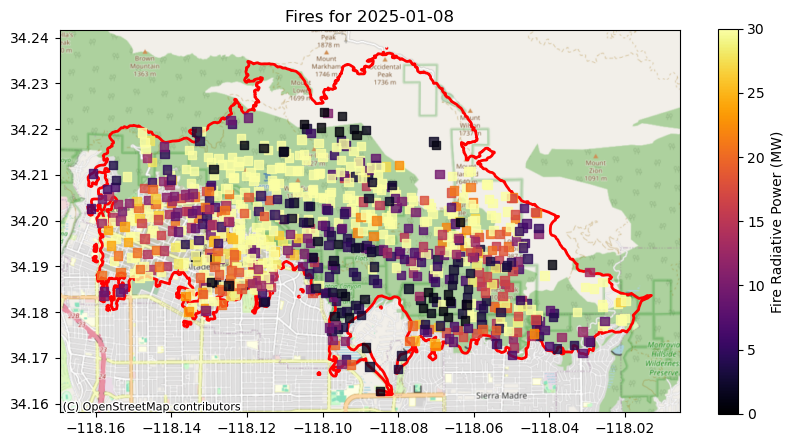

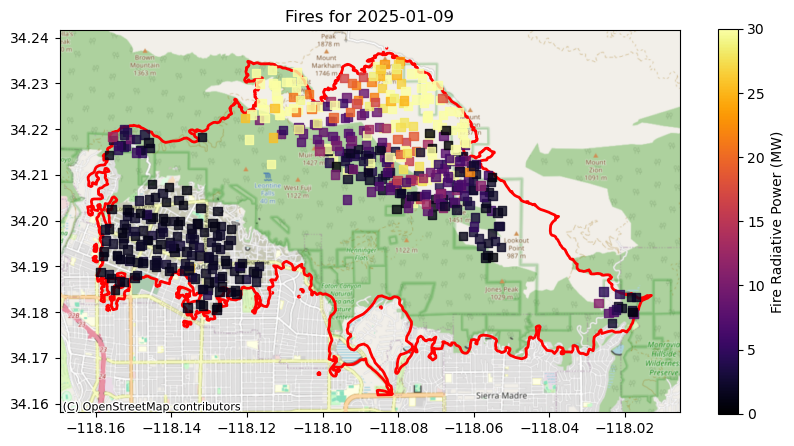

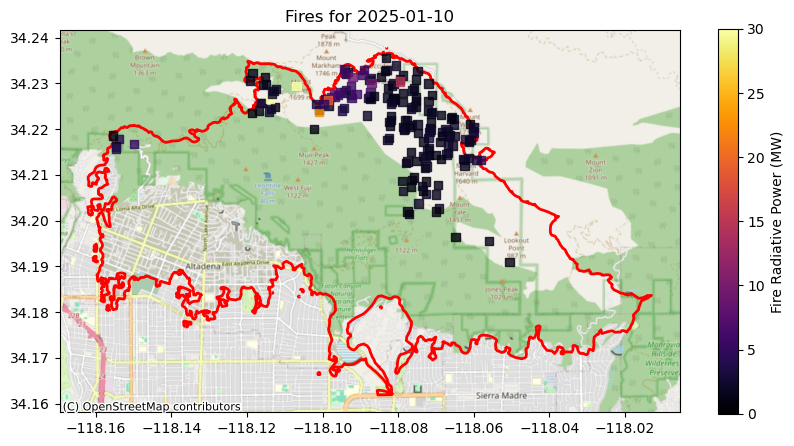

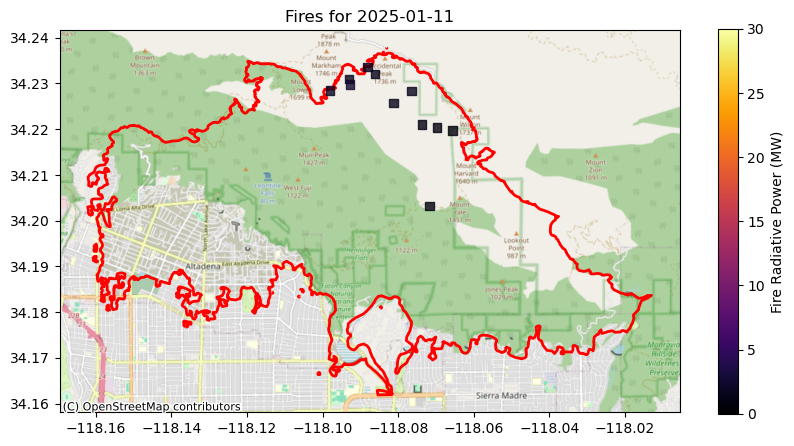

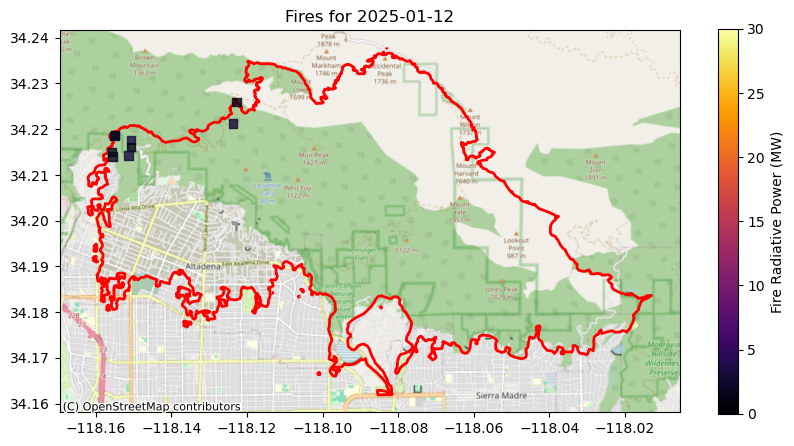

In [28]:
unique_dates = merged_eaton_gdf['ACQ_DATE'].unique()

# Loop through each unique date and plot
for date in unique_dates:
    day_data = merged_eaton_gdf[merged_eaton_gdf['ACQ_DATE'] == date]
    
    fig, ax = plt.subplots(figsize=(10, 5))
    gpd.GeoSeries(fire_perimeter.geometry.iloc[0]).plot(ax=ax, edgecolor="red", facecolor="none", linewidth=2)   
    day_data.plot(ax=ax, column='FRP', cmap='inferno',
                  alpha=0.8, vmin=0, vmax=30, legend=True, marker='s', legend_kwds={'label':'Fire Radiative Power (MW)'})
    
    ctx.add_basemap(ax, source=ctx.providers.OpenStreetMap.Mapnik, crs=fire_perimeter.crs)

    date_str = date.strftime('%Y-%m-%d')
    ax.set_title(f"Fires for {date_str}")
    plt.show()


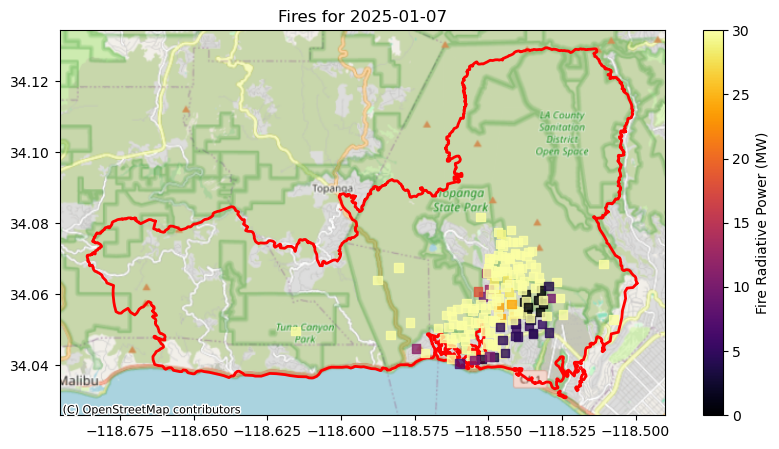

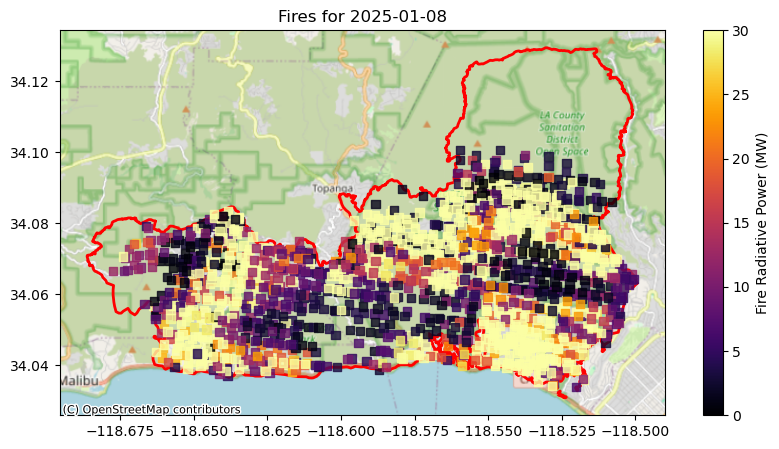

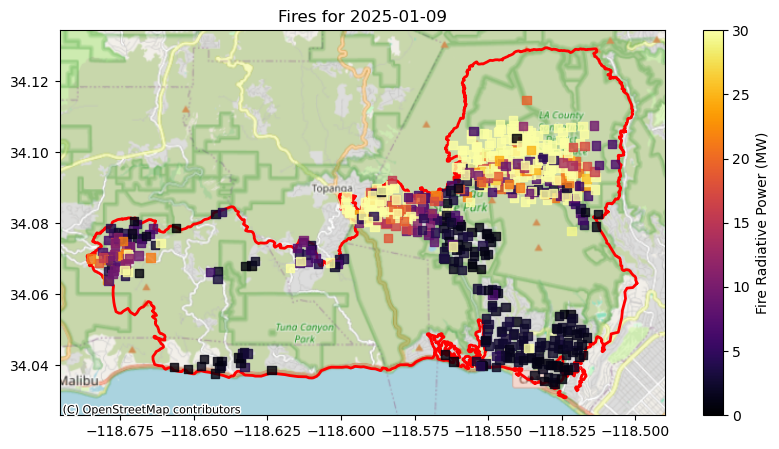

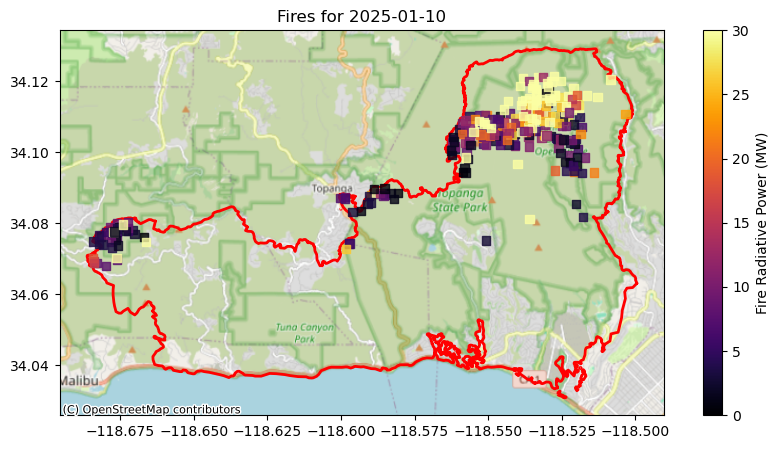

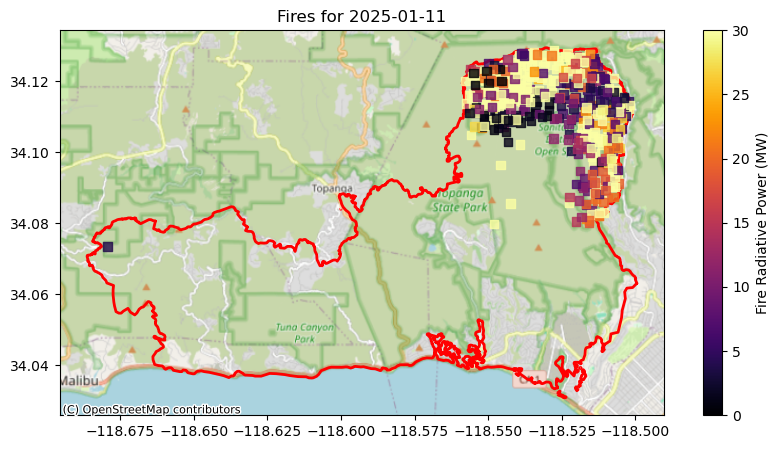

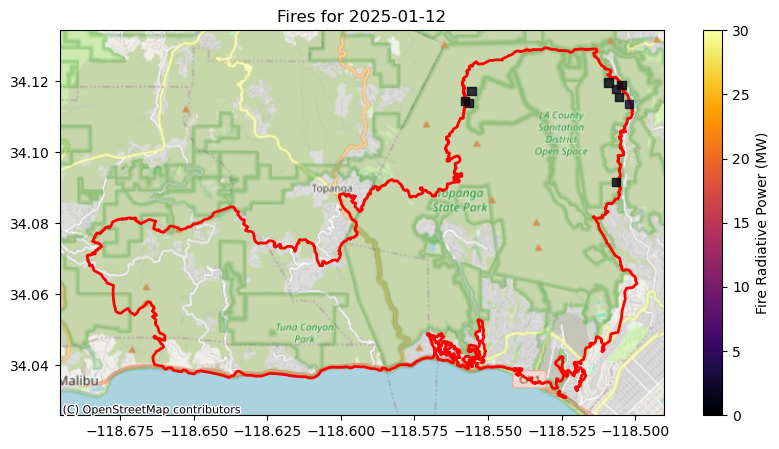

In [69]:
unique_dates = merged_palisades_gdf['ACQ_DATE'].unique()

# Loop through each unique date and plot
for date in unique_dates:
    day_data = merged_palisades_gdf[merged_palisades_gdf['ACQ_DATE'] == date]
    
    fig, ax = plt.subplots(figsize=(10, 5))
    gpd.GeoSeries(fire_perimeter.geometry.iloc[1]).plot(ax=ax, edgecolor="red", facecolor="none", linewidth=2)
    day_data.plot(ax=ax, column='FRP', cmap='inferno', 
                  alpha=0.8, vmin=0, vmax=30, legend=True, marker='s', legend_kwds={'label':'Fire Radiative Power (MW)'})
    
    ctx.add_basemap(ax, source=ctx.providers.OpenStreetMap.Mapnik, crs=fire_perimeter.crs)

    date_str = date.strftime('%Y-%m-%d')
    ax.set_title(f"Fires for {date_str}")
    plt.show()
